# This notebook is for the Finnish Location dataset.

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import SpectralClustering 
from sklearn.preprocessing import StandardScaler, normalize
from sklearn.cluster import DBSCAN 

In [2]:
df = pd.read_table("../datasets/finnish_location.txt")
df.head(3)

,x,y
0,625983,297439
1,626146,297440
2,626144,297456


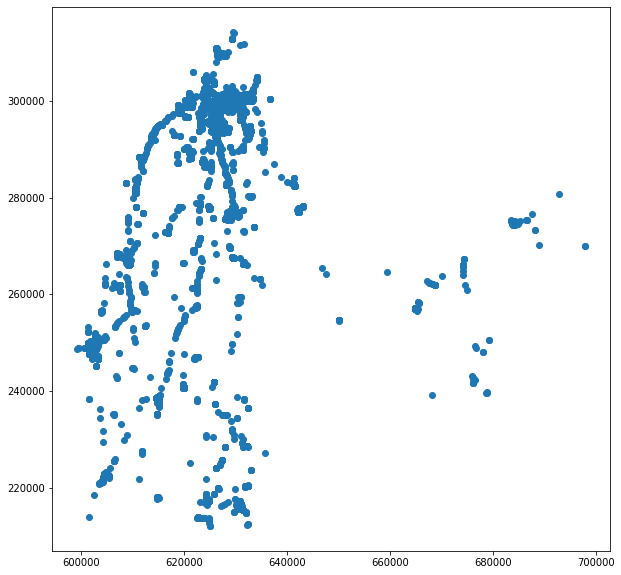

In [3]:
#Let's visualize this data before we pick an algorithm
plt.figure(figsize=(10,10))
plt.scatter(x=df['x'], y=df['y'])
plt.show()

## This is definitely a bad fit for KMeans.

## We can observe some elongated streaks in the data.


In [4]:
#Making sure there are no missing values
df.isna().sum()

x    0
y    0
dtype: int64

In [5]:
# Scaling the Data 
scaler = StandardScaler() 
df_scaled = scaler.fit_transform(df) 
df_scaled = pd.DataFrame(df_scaled)

df_scaled.columns = df.columns
df_scaled

,x,y
0,0.113236,0.413475
1,0.134016,0.413524
2,0.133761,0.414308
3,0.115913,0.411269
4,0.117698,0.413376
...,...,...
13462,0.120757,0.413720
13463,0.112471,0.413671
13464,0.121777,0.411759
13465,0.114765,0.412837


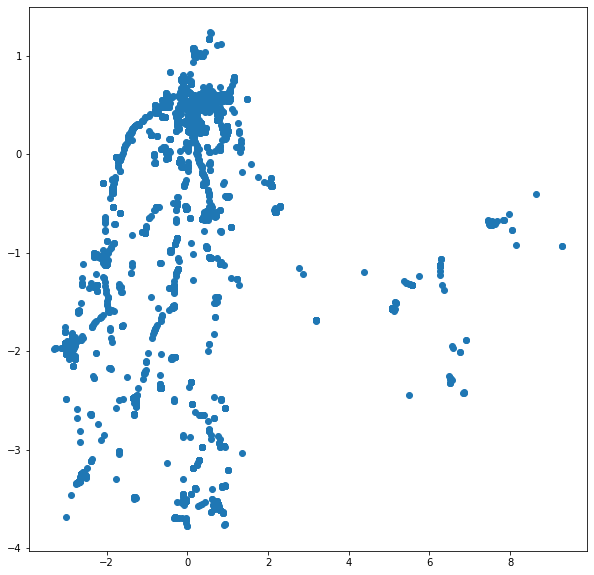

In [6]:
#Scaled data still looks good
plt.figure(figsize=(10,10))
plt.scatter(x=df_scaled['x'], y=df_scaled['y'])
plt.show()

## I am curious if spectral clustering will work well.

In [7]:
# Building the clustering model 
spectral_model_rbf = SpectralClustering(n_clusters = 6, affinity ='rbf') 
  
# Training the model and Storing the predicted cluster labels 
labels_rbf = spectral_model_rbf.fit_predict(df_scaled) 

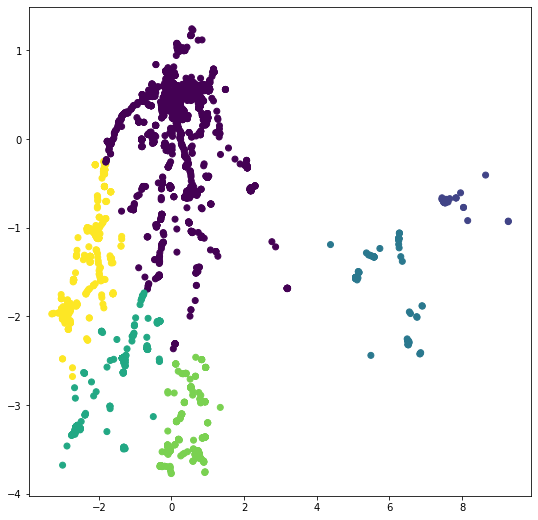

In [8]:

plt.figure(figsize =(9, 9)) 
plt.scatter(df_scaled['x'], df_scaled['y'], c = labels_rbf) 
plt.show()

## I am not satisfied with spectral clustering so let's try DBSCAN.

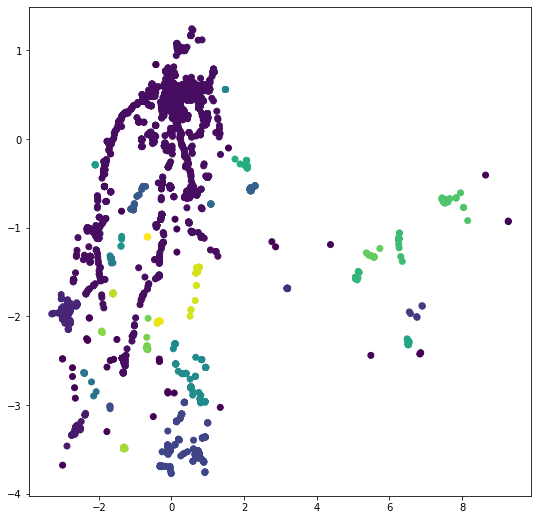

In [9]:
# Numpy array of all the cluster labels assigned to each data point 
db_default = DBSCAN(eps=0.225, min_samples = 4).fit(df_scaled) 
labels = db_default.labels_ 

plt.figure(figsize =(9, 9)) 
plt.scatter(df_scaled['x'], df_scaled['y'], c = labels * 2) 
plt.show()

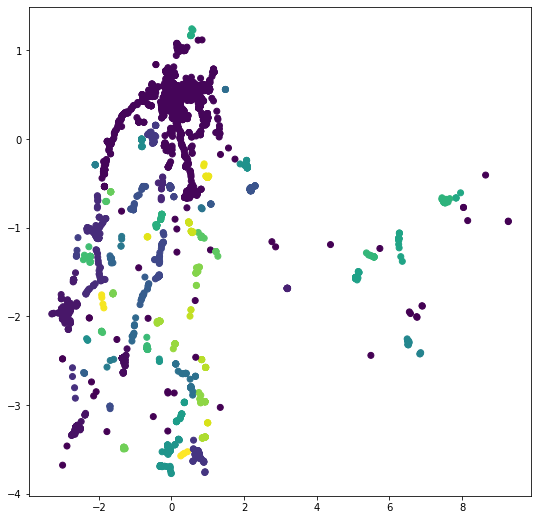

# DBSCAN does a little bit of a better job in separating these 'streaks' but I still don't think the clustering here is optimal.